# Plot filtered tf corrected external data

In [ ]:
from pixell import reproject, enmap, utils, enplot
import matplotlib.pyplot as plt
import numpy as np
import healpy as hp
import pymaster as nmt
from pixell import curvedsky

In [74]:
%matplotlib inline

## Coadded maps

In [ ]:
map_path = '/scratch/gpfs/SIMONSOBS/users/ar3186/external_data/filtered_data/planck/npipe6v20/satp3/f090/coadded_maps/planck_car_100_res1.0amin_coords_c_bundle0_f090_det_lower_filtered.fits'

Any? True


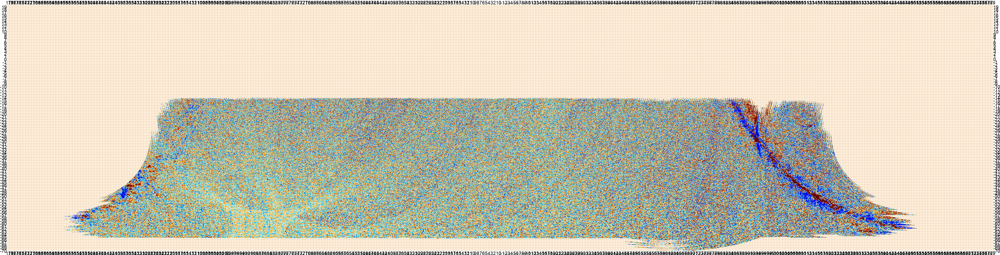

In [ ]:
map = enmap.read_map(map_path)

print("Any?", np.any(map))

enplot.show(enplot.plot(map[1]))

### Power spectra from filtered and tf corrected map

In [77]:
### Plot resulting Cls
cls = np.load('/scratch/gpfs/SIMONSOBS/users/ar3186/external_data/soopercool_outputs/cells/decoupled_pcls_planck_f100_filtered_SATp3_f090_south_science__0_x_planck_f100_filtered_SATp3_f090_south_science__0.npz')

In [78]:
print(list(cls.keys()))

['TT', 'TE', 'TB', 'ET', 'BT', 'EE', 'EB', 'BE', 'BB', 'lb']


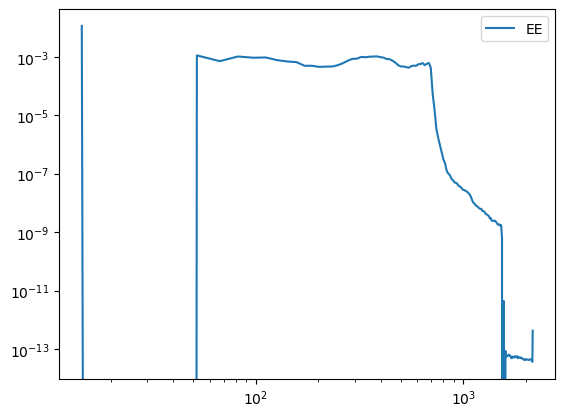

In [79]:
plt.plot(cls['lb'], cls['EE'], label='EE')
plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.show()

### Get real planck map and spectrum

In [80]:
dir_initial_planck_data = '/scratch/gpfs/SIMONSOBS/users/ar3186/external_data/data'
exp = 'planck'
maps_type = 'npipe6v20'
pix = 'hp'
band = '100'
nside = 512
lmax = 2160
coords = 'g'   # available: c equatorial, g galactic

In [81]:
path_initial_planck_data_c = f'{dir_initial_planck_data}/{exp}/maps/{maps_type}/{exp}_{pix}_{band}_nside{nside}_coords_c.fits'
map_initial_planck_data_c = hp.read_map(path_initial_planck_data_c, field=(0,1,2))

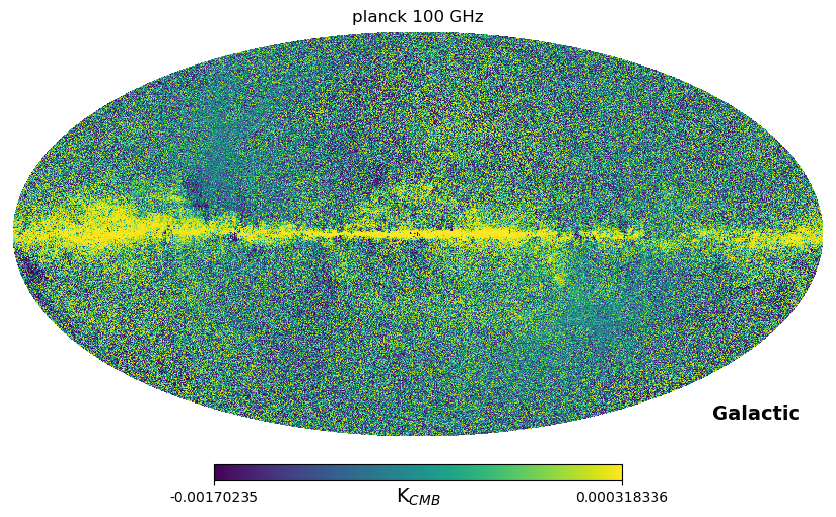

In [82]:
path_initial_planck_data = f'{dir_initial_planck_data}/{exp}/maps/{maps_type}/{exp}_{pix}_{band}_nside{nside}_coords_{coords}.fits'
map_initial_planck_data = hp.read_map(path_initial_planck_data, field=(0,1,2))
hp.mollview(map_initial_planck_data[1], title=f'{exp} {band} GHz', coord=coords, norm='hist', unit=r'K$_{CMB}$')

### Planck data ps comparison : initial data vs filtered and tf corrected data

#### 1) Initial data quick ps anafast full sky

In [83]:
cls_initial_map = hp.anafast(map_initial_planck_data, lmax=lmax)[0]


is this really what you want?


is this really what you want?


is this really what you want?


is this really what you want?



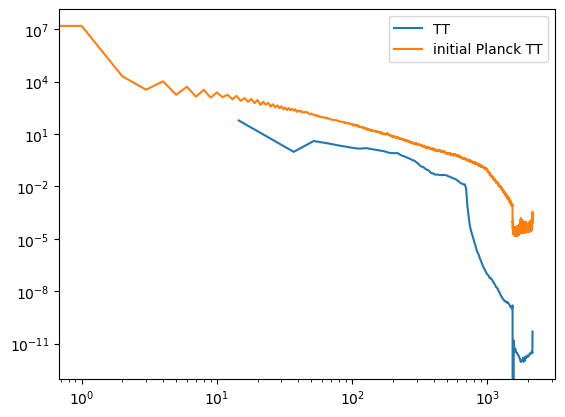

In [84]:
plt.plot(cls['lb'], cls['TT'], label='TT')
plt.plot(cls_initial_map*1e+12, label='initial Planck TT')
plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.show()

#### 2) Initial data quick ps anafast galactic plane masked

In [85]:
path_to_HFI_planck_masks = '/scratch/gpfs/SIMONSOBS/users/ar3186/common/masks/HFI_Mask_GalPlane-apo0_2048_R2.00.fits'

In [86]:
# load HFI Planck masks
mask_HFI_planck = hp.ud_grade(hp.read_map(path_to_HFI_planck_masks, field=3, dtype=np.float64), nside_out=nside)

In [87]:
fsky = np.sum(mask_HFI_planck) / mask_HFI_planck.size
print(f"fsky: {fsky:.4f}")

fsky: 0.7005


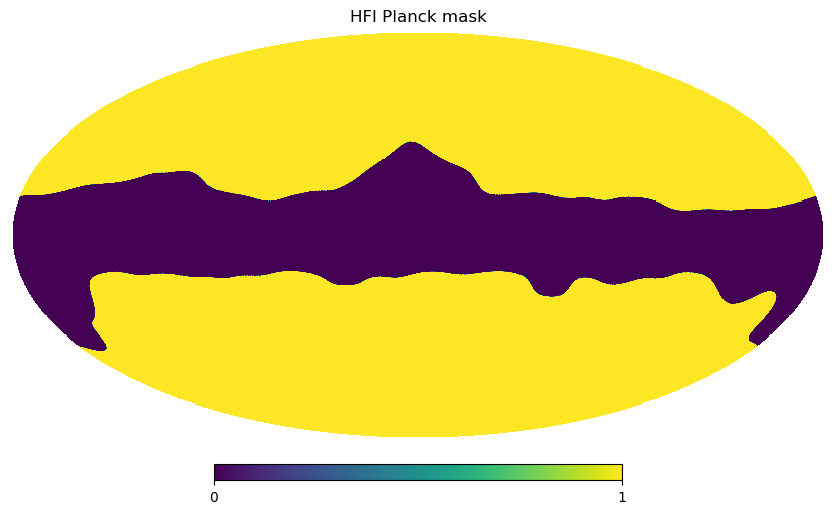

In [88]:
hp.mollview(mask_HFI_planck, title='HFI Planck mask')

In [89]:
cls_initial_map_masked = hp.anafast(map_initial_planck_data*mask_HFI_planck, lmax=lmax)[0]


is this really what you want?


is this really what you want?


is this really what you want?


is this really what you want?



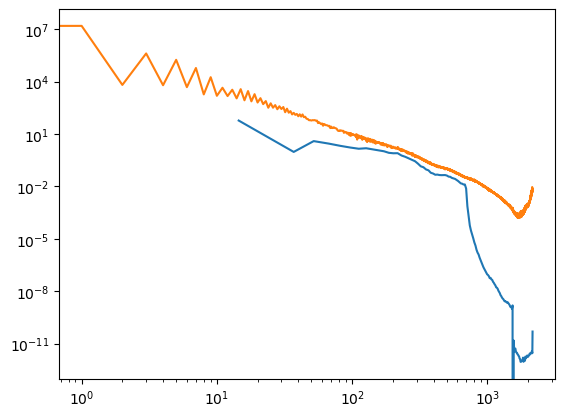

In [90]:
plt.plot(cls['lb'], cls['TT'], label='TT')
plt.plot(cls_initial_map_masked*1e+12/fsky, label='initial Planck TT')
plt.xscale('log')
plt.yscale('log')
plt.show()

#### 3) Initial data with same map applied on the filtered data before the ps computation 
(it's the SO data map + planck HFI 0.7 galactic plane mask)

In [91]:
# load Planck initial data in CAR
path_initial_planck_data_car = f'{dir_initial_planck_data}/{exp}/maps/{maps_type}/{exp}_car_{band}_res1.0amin_coords_c.fits'

In [92]:
# res = 1.0  # arcmin
# geometry = enmap.fullsky_geometry(res=res)
planck_data_init_car = enmap.read_map(path_initial_planck_data_car)
shape, wcs = planck_data_init_car[0].shape, planck_data_init_car[0].wcs

In [93]:
# planck_data_init_car.shape

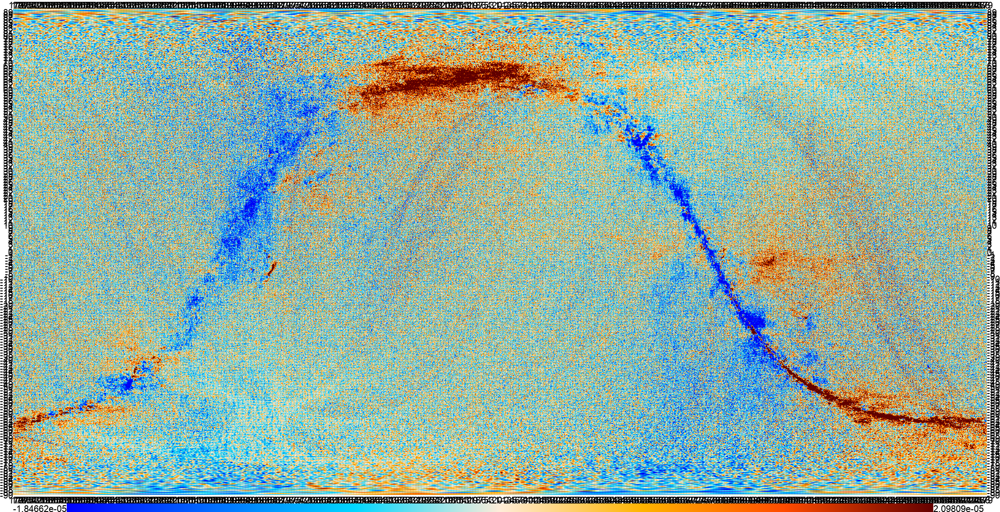

In [94]:
enplot.pshow(planck_data_init_car[1], colorbar=True, downgrade=10)

In [95]:
shape, wcs = analysis_mask_car.shape, analysis_mask_car.wcs 

In [96]:
planck_data_init_car = enmap.read_map(path_initial_planck_data_car, geometry=analysis_mask_car.geometry)

AssertionError: Incompatible wcs in enmap.extract: car:{cdelt:[-0.01667,0.01667],crval:[0.008333,0],crpix:[10800.50,5400.50]} vs. car:{cdelt:[-0.08333,0.08333],crval:[0.04167,0],crpix:[2160.50,840.50]}

In [ ]:
enplot.pshow(planck_data_init_car[1], colorbar=True, downgrade=10)


In [ ]:
### Get the geometry in which to put the initial planck mask and to use in the ps (we always use this gemetry everywhere)

In [ ]:
path_geometry_template = '/home/ar3186/pwg-scripts/iso-sat-review/mapmaking/band_car_fejer1_5arcmin.fits'

In [ ]:
shape, wcs = enmap.read_map_geometry(path_geometry_template)

In [ ]:
# reproject the initial healpix Planck map to car with the geometry from the usual template
# reproject in CAR
planck_init_map_car = reproject.healpix2map(map_initial_planck_data_c, shape=shape, wcs=wcs)
planck_init_map_car.shape

(3, 1080, 4320)

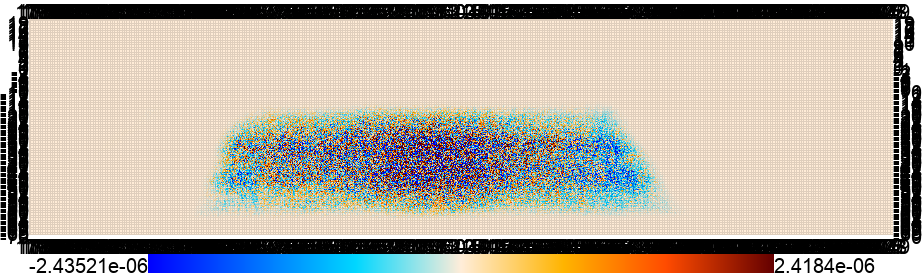

In [ ]:
enplot.pshow(planck_init_map_car[1]*analysis_mask_car, colorbar=True, downgrade=5)

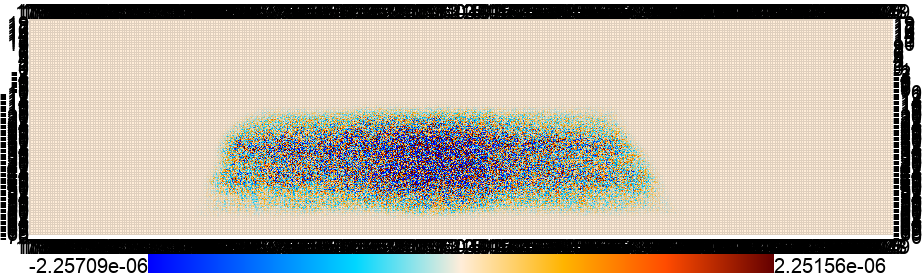

In [ ]:
enplot.pshow(map[1]*analysis_mask_car, colorbar=True, downgrade=5)

In [ ]:

cls_filtered = curvedsky.alm2cl(curvedsky.map2alm(map*analysis_mask_car, lmax=1000))
cls_initial = curvedsky.alm2cl(curvedsky.map2alm(planck_init_map_car*analysis_mask_car, lmax=1000))

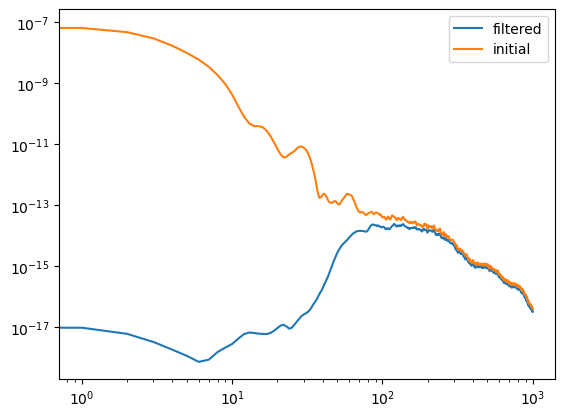

In [ ]:
plt.plot(cls_filtered[0], label='filtered')
plt.plot(cls_initial[0], label='initial')
plt.legend()
plt.xscale('log')
plt.yscale('log')

In [ ]:
# compute ps for car initial planck map
field = nmt.NmtField(mask=analysis_mask_car, maps=[planck_init_map_car[1], planck_init_map_car[2]], wcs=wcs, lmax=lmax, lmax_mask=lmax)
ps = (nmt.compute_full_master(field, field, bin_obj))

In [97]:
# load the analysis mask to use
path_analysis_mask = '/scratch/gpfs/SIMONSOBS/sat-iso/transfer_function/satp3/south/soopercool_outputs/science/masks/analysis_mask.fits'
analysis_mask_car = enmap.read_map(path_analysis_mask)

In [98]:
# shape, wcs = analysis_mask_car.shape, analysis_mask_car.wcs #  this would also get the geometry. That's nearly equivalent to gettting it from the template, apart for numerical differences... so just use it from the template

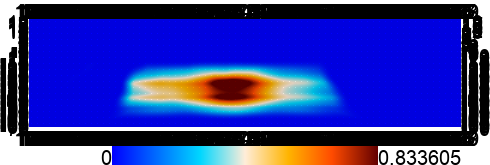

In [99]:
enplot.pshow(analysis_mask_car, colorbar=True, downgrade=10)

In [100]:
planck_init_map_car.shape

(3, 1080, 4320)

In [113]:
binning_file = '/scratch/gpfs/SIMONSOBS/sat-iso/transfer_function/soopercool_inputs/binning_car_lmax2160_deltal15_custom.npz'  #large_first_bin.npz'
binning_edges = np.load(binning_file)

In [114]:
print(list(binning_edges.keys()))

['bin_low', 'bin_high', 'bin_center']


In [115]:
binning_edges['bin_low']

array([   0,   10,   20,   30,   45,   60,   75,   90,  105,  120,  135,
        150,  165,  180,  195,  210,  225,  240,  255,  270,  285,  300,
        315,  330,  345,  360,  375,  390,  405,  420,  435,  450,  465,
        480,  495,  510,  525,  540,  555,  570,  585,  600,  615,  630,
        645,  660,  675,  690,  705,  720,  735,  750,  765,  780,  795,
        810,  825,  840,  855,  870,  885,  900,  915,  930,  945,  960,
        975,  990, 1005, 1020, 1035, 1050, 1065, 1080, 1095, 1110, 1125,
       1140, 1155, 1170, 1185, 1200, 1215, 1230, 1245, 1260, 1275, 1290,
       1305, 1320, 1335, 1350, 1365, 1380, 1395, 1410, 1425, 1440, 1455,
       1470, 1485, 1500, 1515, 1530, 1545, 1560, 1575, 1590, 1605, 1620,
       1635, 1650, 1665, 1680, 1695, 1710, 1725, 1740, 1755, 1770, 1785,
       1800, 1815, 1830, 1845, 1860, 1875, 1890, 1905, 1920, 1935, 1950,
       1965, 1980, 1995, 2010, 2025, 2040, 2055, 2070, 2085, 2100, 2115,
       2130, 2145, 2160])

In [116]:
binning_edges['bin_high']

array([   9,   19,   29,   44,   59,   74,   89,  104,  119,  134,  149,
        164,  179,  194,  209,  224,  239,  254,  269,  284,  299,  314,
        329,  344,  359,  374,  389,  404,  419,  434,  449,  464,  479,
        494,  509,  524,  539,  554,  569,  584,  599,  614,  629,  644,
        659,  674,  689,  704,  719,  734,  749,  764,  779,  794,  809,
        824,  839,  854,  869,  884,  899,  914,  929,  944,  959,  974,
        989, 1004, 1019, 1034, 1049, 1064, 1079, 1094, 1109, 1124, 1139,
       1154, 1169, 1184, 1199, 1214, 1229, 1244, 1259, 1274, 1289, 1304,
       1319, 1334, 1349, 1364, 1379, 1394, 1409, 1424, 1439, 1454, 1469,
       1484, 1499, 1514, 1529, 1544, 1559, 1574, 1589, 1604, 1619, 1634,
       1649, 1664, 1679, 1694, 1709, 1724, 1739, 1754, 1769, 1784, 1799,
       1814, 1829, 1844, 1859, 1874, 1889, 1904, 1919, 1934, 1949, 1964,
       1979, 1994, 2009, 2024, 2039, 2054, 2069, 2084, 2099, 2114, 2129,
       2144, 2159, 2160])

In [105]:
bin_obj = nmt.NmtBin.from_edges(ell_ini=binning_edges['bin_low'][:-1], ell_end=binning_edges['bin_high'][:-1], is_Dell=False)

In [106]:
lmax=2158

# TT

In [107]:
# compute ps for car initial planck map
field = nmt.NmtField(mask=analysis_mask_car, maps=[planck_init_map_car[0]], wcs=wcs, lmax=lmax, lmax_mask=lmax)
ps = (nmt.compute_full_master(field, field, bin_obj))

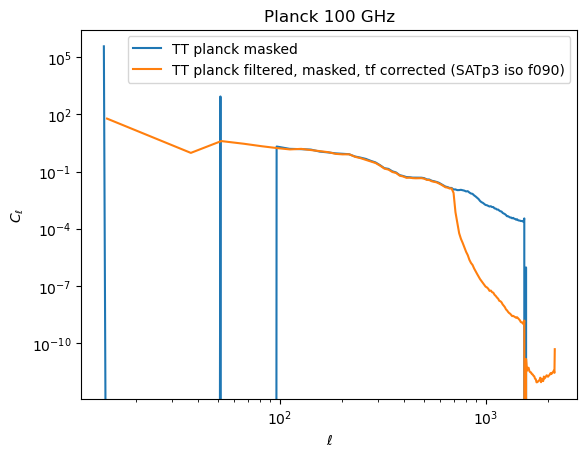

In [108]:
plt.plot(bin_obj.get_effective_ells(), ps[0]*1e12, label='TT planck masked')
plt.plot(cls['lb'], cls['TT'], label='TT planck filtered, masked, tf corrected (SATp3 iso f090)')
# plt.plot(cls_initial_map_masked*1e+12/fsky, label='initial Planck TT')
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$\ell$')
plt.ylabel(r'$C_\ell$')
plt.title('Planck 100 GHz')
plt.legend()
plt.show()

In [109]:
# EE

In [110]:
# compute ps for car initial planck map
field = nmt.NmtField(mask=analysis_mask_car, maps=[planck_init_map_car[1], planck_init_map_car[2]], wcs=wcs, lmax=lmax, lmax_mask=lmax)
ps = (nmt.compute_full_master(field, field, bin_obj))

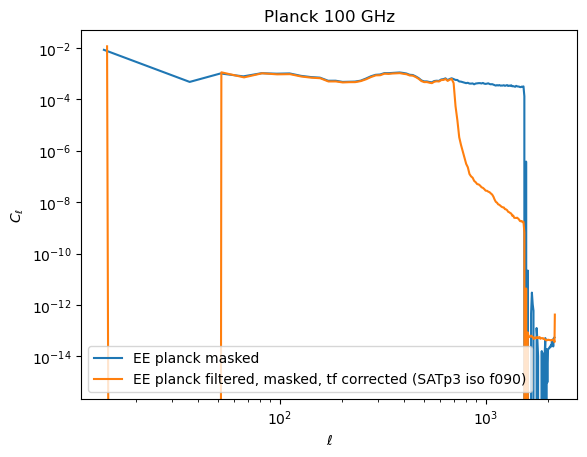

In [111]:
plt.plot(bin_obj.get_effective_ells(), ps[0]*1e12, label='EE planck masked')
plt.plot(cls['lb'], cls['EE'], label='EE planck filtered, masked, tf corrected (SATp3 iso f090)')
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$\ell$')
plt.ylabel(r'$C_\ell$')
plt.title('Planck 100 GHz')
plt.legend()
plt.show()

Why in EE there's a difference between the two spectra ?
Hypothesis:
- there's some inconsistency  arising from the fact that the planck maps are originally beamed and we never accounted for that... but it shouldn't be that, as bitht the filtered and initial one have the same beam. Filtering a beamed ps is not the same of 
- pixel window function issue ?? 

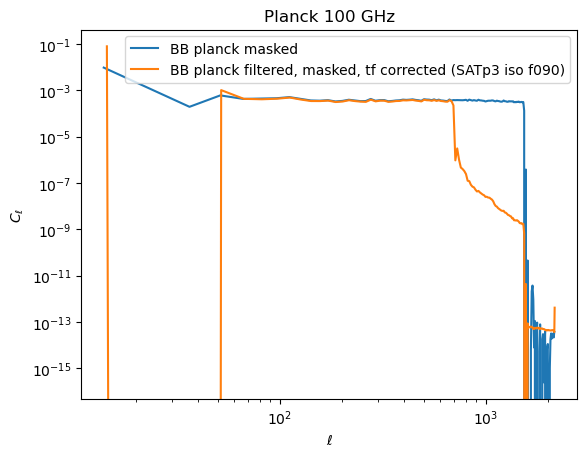

In [112]:
plt.plot(bin_obj.get_effective_ells(), ps[3]*1e12, label='BB planck masked')
plt.plot(cls['lb'], cls['BB'], label='BB planck filtered, masked, tf corrected (SATp3 iso f090)')
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$\ell$')
plt.ylabel(r'$C_\ell$')
plt.title('Planck 100 GHz')
plt.legend()
plt.show()